### Plotting

In [1]:
using Plots

Simple plots

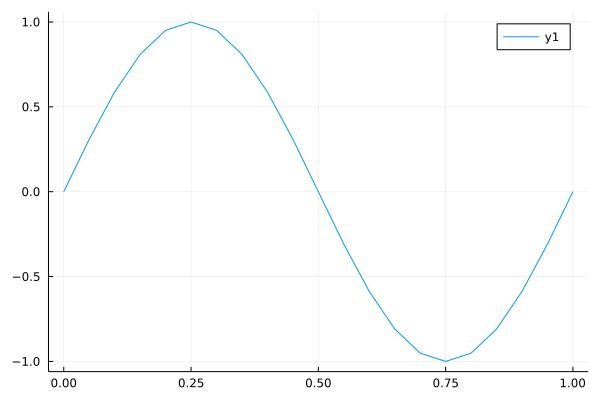

In [2]:
x = 0:0.05:1
y = sin.(2π * x)
plot(x,y)

linestyle = :solid :dash :dot :dashdot :dashdotdot

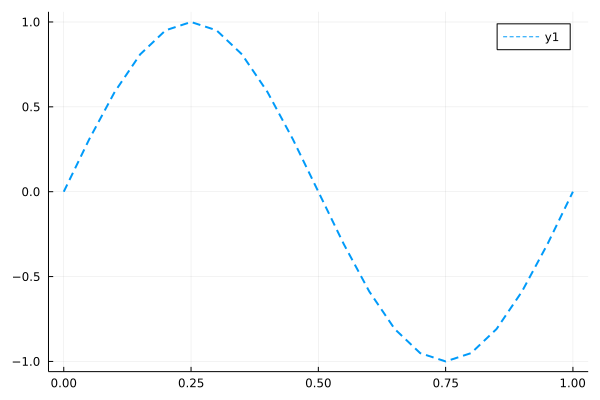

In [9]:
plot(x, y, 
     lw = 2,
     linestyle =:dash)

seriestype = :path :scatter :bar :sticks

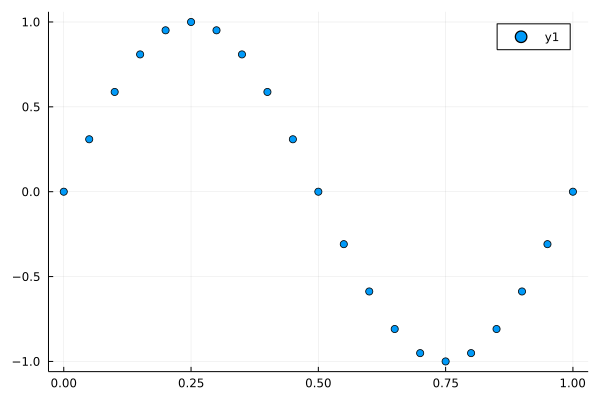

In [5]:
plot(x, y, 
     seriestype = :scatter)

Color list: [https://github.com/JuliaGraphics/Colors.jl/blob/master/src/names_data.jl](https://github.com/JuliaGraphics/Colors.jl/blob/master/src/names_data.jl)

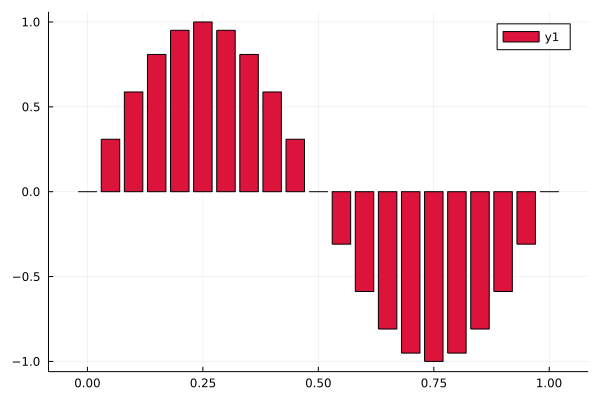

In [11]:
plot(x,y,
     seriestype = :bar,
     seriescolor = :crimson)

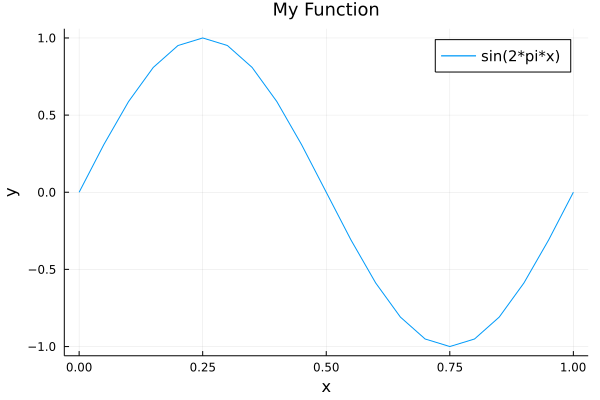

In [19]:
plot(   x,y,
        title="My Function",
        xlabel="x",
        ylabel="y",
        label="sin(2*pi*x)",
        titlefontsize=12,
        legendfontsize=10,
        legend=:topright
)

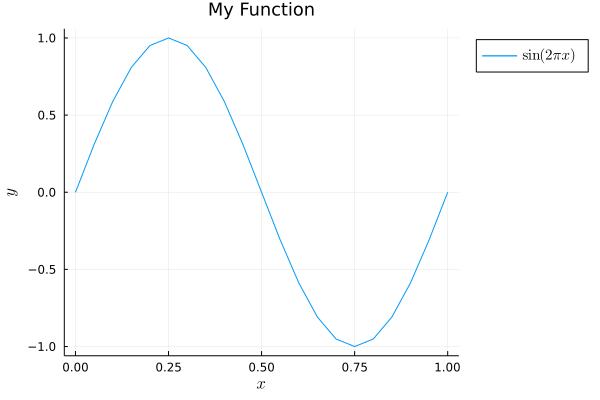

In [22]:
using LaTeXStrings

plot(   x,y,
        title="My Function",
        xlabel=L"x",
        ylabel=L"y",
        label=L"\sin (2 \pi x)",
        titlefontsize=12,
        legendfontsize=10,
        legend=:outertopright
)

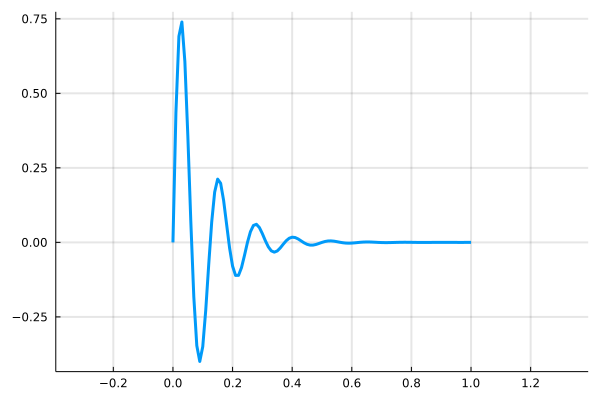

In [31]:
x = 0:0.01:1;
y = @. sin(8*2π*x)/exp(10*x);

plot(
    x,y, 
    lw=3,
    label=false,
    aspect_ratio = :equal,
    gridlinewidth=2
    )

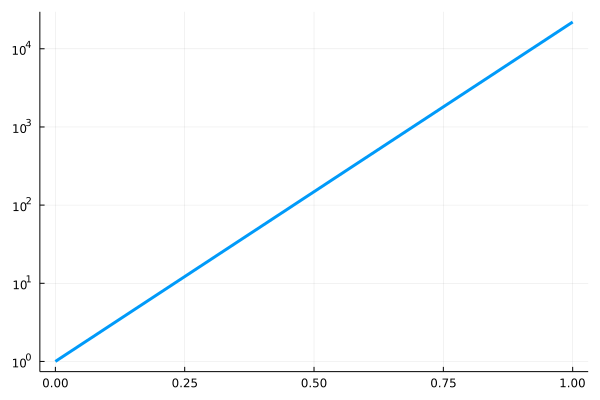

In [34]:
x = 0:0.01:1;
y = @. exp(10*x);
plot(
    x,y, 
    yscale=:log10,
    lw=3,
    label=false
    )

## Multiple Plots

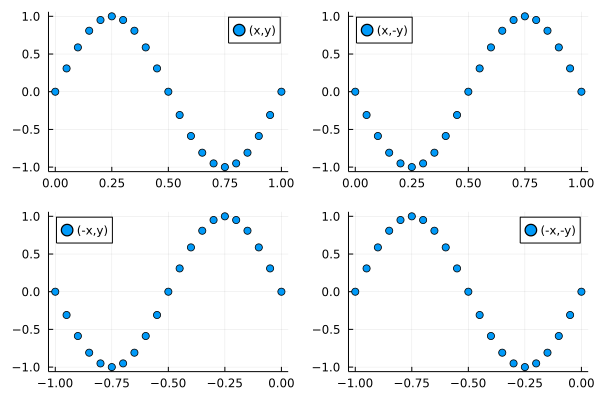

In [23]:

p1 = scatter(x, y, label="(x,y)")    
p2 = scatter(x, -y, label="(x,-y)", legend=:topleft)    
p3 = scatter(-x, y, label="(-x,y)", legend=:topleft)    
p4 = scatter(-x, -y, label="(-x,-y)")    


plot(p1,p2,p3,p4, layout = (2,2) )

### Histogram 2D

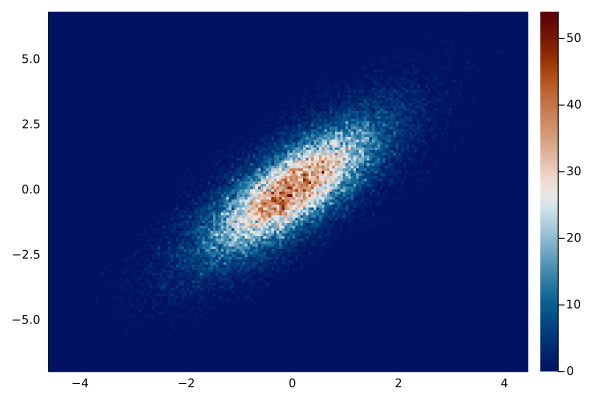

In [35]:
x = randn(50000);
y = x * 1.2 + randn(50000);

plot(
    x,
    y,
    seriestype = :histogram2d,
    c = :vik,
    nbins = 200,
    show_empty_bins = :true
)


### Contours

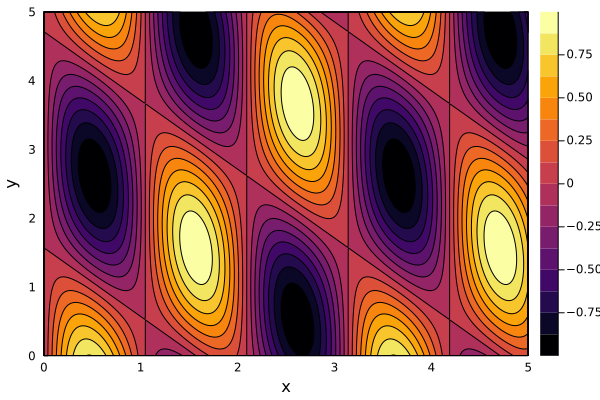

In [36]:
f(x,y) = sin(3x) * cos(x+y)

x = 0:0.01:5
y = 0:0.01:5
contour(x, y, f, xlabel="x", ylabel="y", fill=true)

# 3D Plots

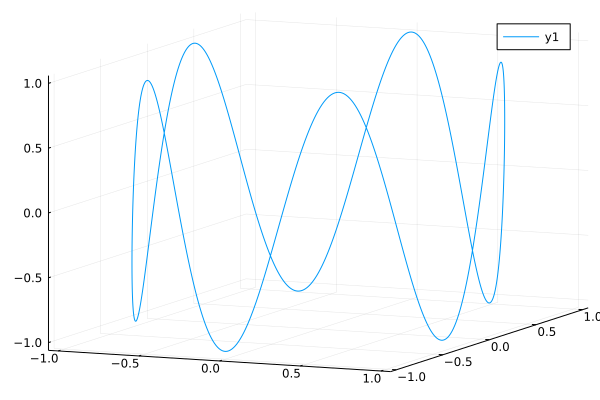

In [37]:
t = range(0, stop=10, length=1000)
x = cos.(t)
y = sin.(t)
z = sin.(5t)

plot(x, y, z)

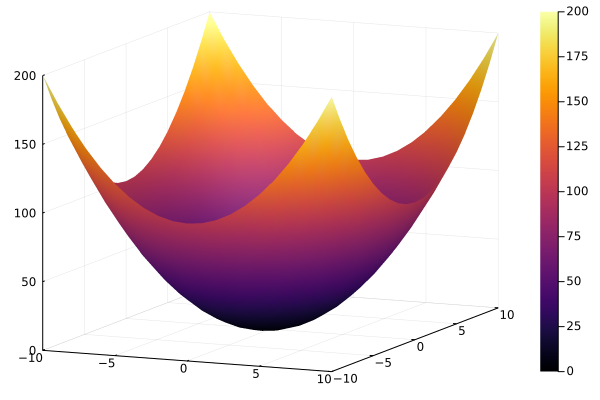

In [38]:
f(x,y) = x^2 + y^2
x = -10:10
y = x
surface(x, y, f)

### Animating Plots

┌ Info: Saved animation to 
│   fn = /Users/eduard/Desktop/tmp.gif
└ @ Plots /Users/eduard/.julia/packages/Plots/dNEbX/src/animation.jl:114


Plots.AnimatedGif("/Users/eduard/Desktop/tmp.gif")
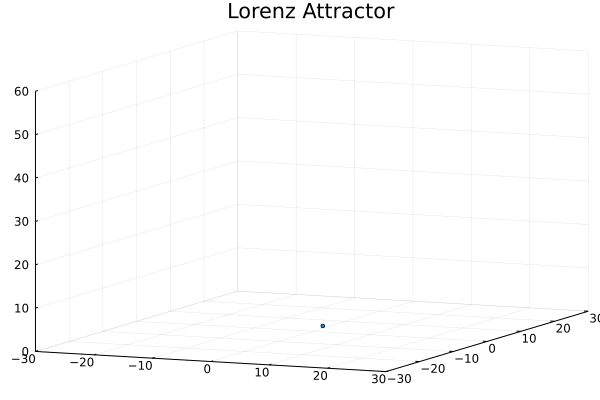

In [39]:
using Plots
# define the Lorenz attractor
Base.@kwdef mutable struct Lorenz
    dt::Float64 = 0.02
    σ::Float64 = 10
    ρ::Float64 = 28
    β::Float64 = 8/3
    x::Float64 = 1
    y::Float64 = 1
    z::Float64 = 1
end

function step!(l::Lorenz)
    dx = l.σ * (l.y - l.x)
    dy = l.x * (l.ρ - l.z) - l.y
    dz = l.x * l.y - l.β * l.z
    l.x += l.dt * dx
    l.y += l.dt * dy
    l.z += l.dt * dz
end

attractor = Lorenz()


# initialize a 3D plot with 1 empty series
plt = plot3d(
    1,
    xlim = (-30, 30),
    ylim = (-30, 30),
    zlim = (0, 60),
    title = "Lorenz Attractor",
    legend = false,
    marker = 2,
)

# build an animated gif by pushing new points to the plot, saving every 10th frame
@gif for i=1:1500
    step!(attractor)
    push!(plt, attractor.x, attractor.y, attractor.z)
end every 10


┌ Info: Saved animation to 
│   fn = /Users/eduard/Desktop/tmp.gif
└ @ Plots /Users/eduard/.julia/packages/Plots/dNEbX/src/animation.jl:114


Plots.AnimatedGif("/Users/eduard/Desktop/tmp.gif")
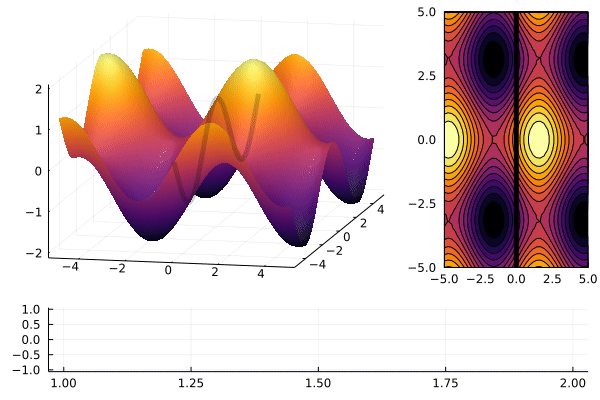

In [40]:
using Plots
default(legend = false)
x = y = range(-5, 5, length = 40)
zs = zeros(0, 40)
n = 100

@gif for i in range(0, stop = 2π, length = n)
    f(x, y) = sin(x + 10sin(i)) + cos(y)

    # create a plot with 3 subplots and a custom layout
    l = @layout [a{0.7w} b; c{0.2h}]
    p = plot(x, y, f, st = [:surface, :contourf], layout = l)

    # induce a slight oscillating camera angle sweep, in degrees (azimuth, altitude)
    plot!(p[1], camera = (10 * (1 + cos(i)), 40))

    # add a tracking line
    fixed_x = zeros(40)
    z = map(f, fixed_x, y)
    plot!(p[1], fixed_x, y, z, line = (:black, 5, 0.2))
    vline!(p[2], [0], line = (:black, 5))

    # add to and show the tracked values over time
    global zs = vcat(zs, z')
    plot!(p[3], zs, alpha = 0.2, palette = cgrad(:blues).colors)
end
